# Description

# Import Images

In [3]:
from __future__ import annotations

from pathlib import Path
from PIL import Image

FIGURES_ROOT = Path(
    r"/Users/yangxiyu/Library/Mobile Documents/com~apple~CloudDocs/research/disease_progression/manuscript/figures"
)
ORIGINAL_IMAGES_ROOT = FIGURES_ROOT / "original_images"

IMAGE_EXTS = {".png", ".jpg", ".jpeg", ".tif", ".tiff", ".bmp", ".gif", ".webp"}


def load_images_grouped_by_folder(root: Path) -> tuple[dict[str, list[dict]], dict[str, Image.Image]]:
    """Load images under `root`, grouped by immediate folder.

    - If images are directly under `root/`, they are grouped under the key `"__root__"`.
    - If images are under subfolders, each subfolder is its own group.
    """

    images_by_folder: dict[str, list[dict]] = {}
    images_by_path: dict[str, Image.Image] = {}

    groups: list[tuple[str, Path]] = [("__root__", root)] + [
        (p.name, p) for p in sorted([p for p in root.iterdir() if p.is_dir()])
    ]

    for group_name, folder in groups:
        image_files = sorted(
            [p for p in folder.rglob("*") if p.is_file() and p.suffix.lower() in IMAGE_EXTS]
        )

        records: list[dict] = []
        for p in image_files:
            with Image.open(p) as im:
                images_by_path[str(p)] = im.copy()  # detach from file handle

            records.append(
                {
                    "folder": group_name,
                    "path": str(p),
                    "filename": p.name,
                    "stem": p.stem,
                    "ext": p.suffix.lower(),
                }
            )

        images_by_folder[group_name] = records

    return images_by_folder, images_by_path


# saliency/overlay images (subfolders under FIGURES_ROOT)
images_by_folder, images_by_path = load_images_grouped_by_folder(FIGURES_ROOT)

# original images (subfolders under ORIGINAL_IMAGES_ROOT)
original_images_by_folder, original_images_by_path = load_images_grouped_by_folder(
    ORIGINAL_IMAGES_ROOT
)

# quick sanity check summaries
summary = {k: len(v) for k, v in images_by_folder.items()}
summary_original = {k: len(v) for k, v in original_images_by_folder.items()}
{
    "figures_total": sum(summary.values()),
    "original_total": sum(summary_original.values()),
    "figures_by_folder": summary,
    "original_by_folder": summary_original,
}

{'figures_total': 108,
 'original_total': 6,
 'figures_by_folder': {'__root__': 54,
  'model_allraces_on_black': 8,
  'model_allraces_on_non_white_black': 8,
  'model_allraces_on_white': 8,
  'model_black_on_black': 8,
  'model_non_white_black_on_non_white_black': 8,
  'model_white_on_white': 8,
  'original_images': 6},
 'original_by_folder': {'__root__': 6}}

# Create Helper Function

In [37]:
from __future__ import annotations

import re
from pathlib import Path

import matplotlib.pyplot as plt
from PIL import Image


_COMBO_TO_SAMPLE = {
    # White
    "MTM-White": {"sample_id": "376264", "cohort": "white"},
    "Non-MTM-White": {"sample_id": "379524", "cohort": "white"},
    # Black
    "MTM-Black": {"sample_id": "490418", "cohort": "black"},
    "Non-MTM-Black": {"sample_id": "371537", "cohort": "black"},
    # Non-White, Non-Black
    "MTM-Non-White-Non-Black": {"sample_id": "264805", "cohort": "non_white_black"},
    "Non-MTM-Non-White-Non-Black": {"sample_id": "265691", "cohort": "non_white_black"},
}


def _normalize_combo_key(combo: str) -> str:
    s = combo.strip()
    s = re.sub(r"\s+", " ", s)
    s = s.replace(",", "")
    s = s.replace("Non White", "Non-White")
    s = s.replace("Non Black", "Non-Black")
    s = s.replace("Non-White Non-Black", "Non-White-Non-Black")
    s = s.replace("Non-White, Non-Black", "Non-White-Non-Black")
    s = s.replace("Non-White/Non-Black", "Non-White-Non-Black")
    s = s.replace("Non-White-Non-Black", "Non-White-Non-Black")

    # ensure separators are hyphens
    s = s.replace(" - ", "-")
    s = s.replace(" ", "-")

    # common variants
    s = s.replace("NonMTM", "Non-MTM")

    return s


def _first_match_path(model_folder: str, sample_id: str, required_tokens: list[str]) -> str:
    """Find first matching image path in `images_by_folder[model_folder]`.

    `required_tokens` are matched as exact underscore-delimited tokens.

    Example token: "overlay_trained" matches "_overlay_trained_" in filenames.
    This avoids accidental matches like "trained" within "untrained".
    """

    candidates = images_by_folder.get(model_folder)
    if not candidates:
        raise KeyError(f"Model folder not found in images_by_folder: {model_folder}")

    req = [f"_{t.lower()}_" for t in required_tokens]

    for rec in candidates:
        filename = str(rec["filename"]).lower()
        if sample_id in filename and all(r in filename for r in req):
            return rec["path"]

    raise FileNotFoundError(
        f"No match for sample_id={sample_id} in {model_folder} with tokens={required_tokens}"
    )


def show_combo_grid(
    combo: str,
    *,
    figsize=(10, 10),
    save: bool = False,
    save_root: Path | str = FIGURES_ROOT,
    save_subdir: str = "exported_panels",
    save_format: str = "png",
) -> plt.Figure:
    """Display a 3×3 grid for one disease-ethnicity combination.

    Rows (top→bottom): multi-ethnicity trained, ethnicity-specific trained, multi-ethnicity untrained
    Cols (left→right): original image, overlay image, grad-cam image

    If `save=True`, saves each of the 9 displayed images under:
    `Path(save_root) / save_subdir / <combo_key>/...`
    """

    key = _normalize_combo_key(combo)
    if key not in _COMBO_TO_SAMPLE:
        raise KeyError(
            f"Unknown combo {combo!r}. Expected one of: {list(_COMBO_TO_SAMPLE.keys())}"
        )

    sample_id = _COMBO_TO_SAMPLE[key]["sample_id"]
    cohort = _COMBO_TO_SAMPLE[key]["cohort"]

    # row model folders
    folder_multi = f"model_allraces_on_{cohort}"
    folder_specific = (
        f"model_{cohort}_on_{cohort}"
        if cohort != "non_white_black"
        else "model_non_white_black_on_non_white_black"
    )

    # column paths
    original_path = str(ORIGINAL_IMAGES_ROOT / f"{sample_id}.jpg")

    # multi-ethnicity trained
    overlay_multi_trained = _first_match_path(folder_multi, sample_id, ["overlay_trained"])
    gradcam_multi_trained = _first_match_path(folder_multi, sample_id, ["gradcam_trained"])

    # ethnicity-specific trained
    overlay_spec_trained = _first_match_path(folder_specific, sample_id, ["overlay_trained"])
    gradcam_spec_trained = _first_match_path(folder_specific, sample_id, ["gradcam_trained"])

    # multi-ethnicity untrained (same folder as multi)
    overlay_multi_untrained = _first_match_path(folder_multi, sample_id, ["overlay_untrained"])
    gradcam_multi_untrained = _first_match_path(folder_multi, sample_id, ["gradcam_untrained"])

    grid_paths: list[list[str]] = [
        [original_path, overlay_multi_untrained, gradcam_multi_untrained],
        [original_path, overlay_spec_trained, gradcam_spec_trained],
        [original_path, overlay_multi_trained, gradcam_multi_trained],
    ]

    # kept for consistency (not used for saving combined panels)
    row_keys = ["multi_untrained", "specific_trained", "multi_trained"]
    col_keys = ["original", "overlay", "gradcam"]

    row_titles = [
        "ImageNet-pretrained",
        "Ethnicity-specific",
        "Multi-ethnicity",
    ]
    col_titles = ["Original", "Overlay", "Grad-CAM"]

    def _extract_prob_from_path(path: str) -> str:
        m = re.search(r"_p(?P<p>\d+\.\d+)", Path(path).name)
        if not m:
            return "NA"
        return f"p{m.group('p')}"

    p_multi = _extract_prob_from_path(gradcam_multi_trained)
    p_specific = _extract_prob_from_path(gradcam_spec_trained)

    fig, axes = plt.subplots(3, 3, figsize=figsize)
    fig.suptitle(
        f"{key} (Multi-ethnicity: {p_multi}, Ethnicity-specific: {p_specific})",
        y=0.98,
        fontsize=14,
    )

    def _get_img(path: str) -> Image.Image:
        img = images_by_path.get(path) or original_images_by_path.get(path)
        if img is None:
            img = Image.open(path).copy()
        return img

    for r in range(3):
        for c in range(3):
            ax = axes[r, c]
            path = grid_paths[r][c]
            img = _get_img(path)

            ax.imshow(img)
            ax.axis("off")

            if r == 0:
                ax.set_title(col_titles[c], fontsize=11)
            if c == 0:
                ax.text(
                    -0.02,
                    0.5,
                    row_titles[r],
                    transform=ax.transAxes,
                    rotation=90,
                    va="center",
                    ha="right",
                    fontsize=11,
                )

    plt.tight_layout()

    if save:
        out_dir = Path(save_root) / save_subdir
        out_dir.mkdir(parents=True, exist_ok=True)
        ext = save_format.lstrip(".")
        out_path = out_dir / f"{sample_id}_{key}_grid.{ext}"
        fig.savefig(out_path, dpi=300, bbox_inches="tight")

# Display Images

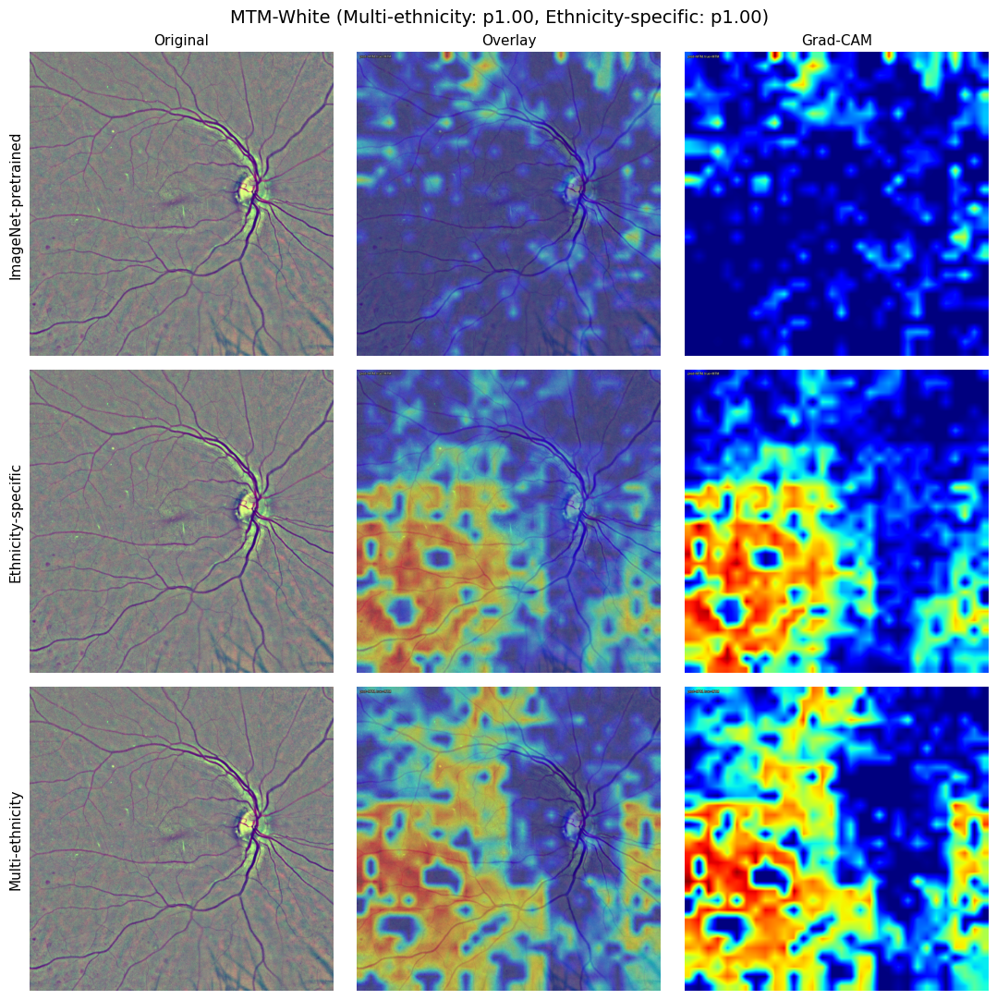

In [38]:
show_combo_grid(
    "MTM-White", 
    figsize=(11, 11),
    save=True,
    save_root=FIGURES_ROOT,      # defaults to figures/ already
    save_subdir="exported_panels",
    save_format="png",
)

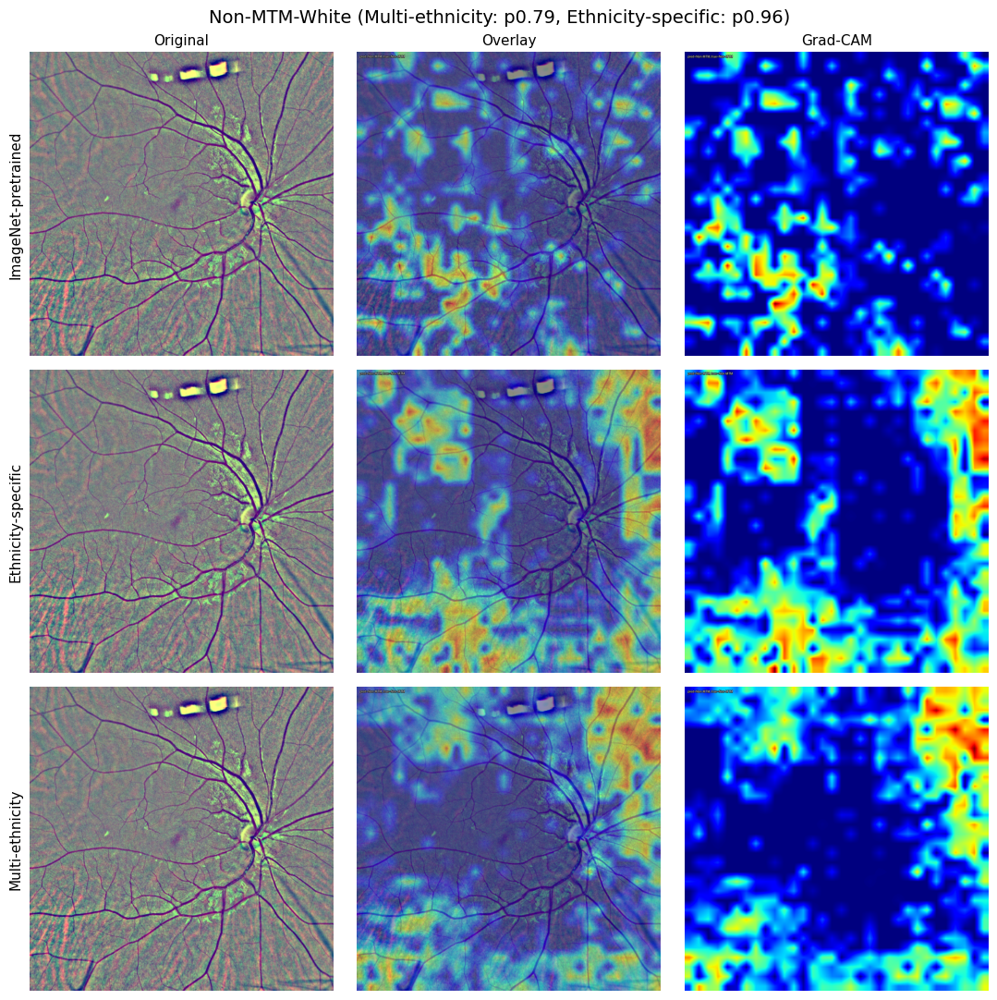

In [39]:
show_combo_grid(
    "Non-MTM-White", 
    figsize=(11, 11),
    save=True,
    save_root=FIGURES_ROOT,      # defaults to figures/ already
    save_subdir="exported_panels",
    save_format="png",
)

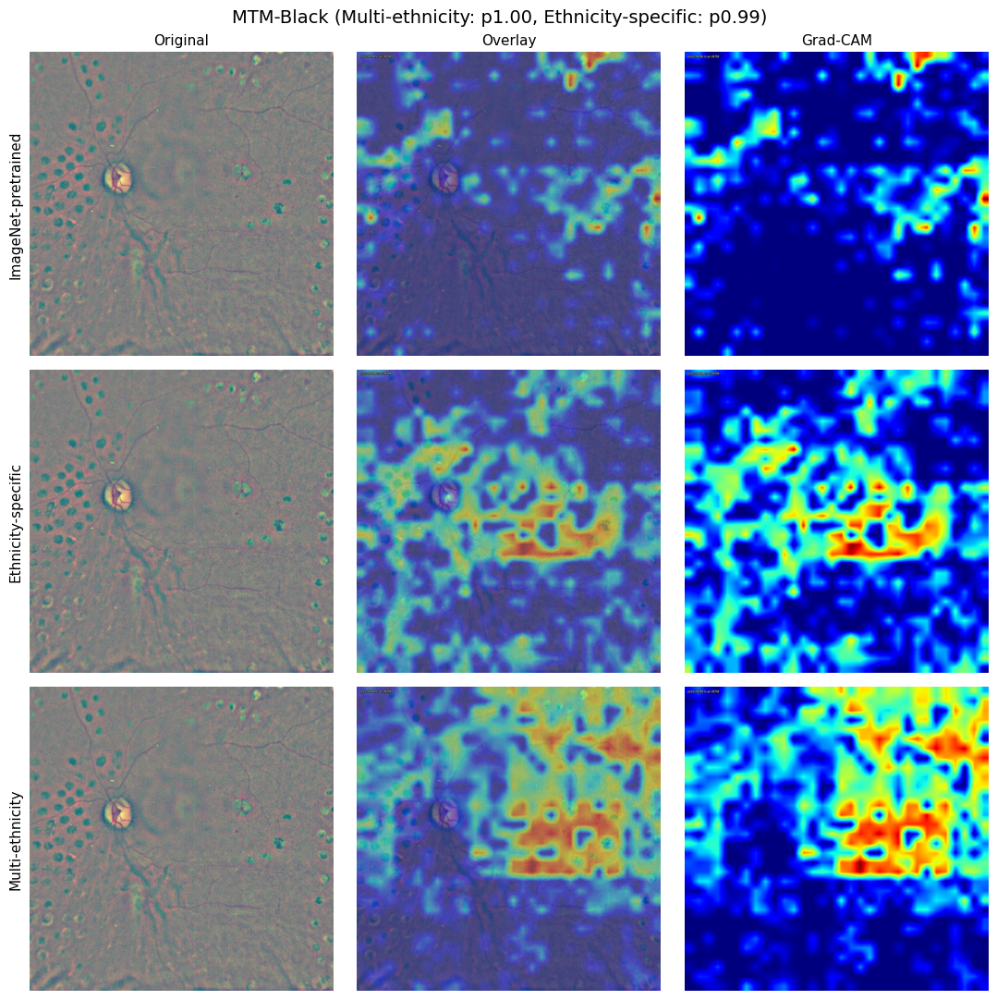

In [40]:
show_combo_grid(
    "MTM-Black", 
    figsize=(11, 11),
    save=True,
    save_root=FIGURES_ROOT,      # defaults to figures/ already
    save_subdir="exported_panels",
    save_format="png",
)

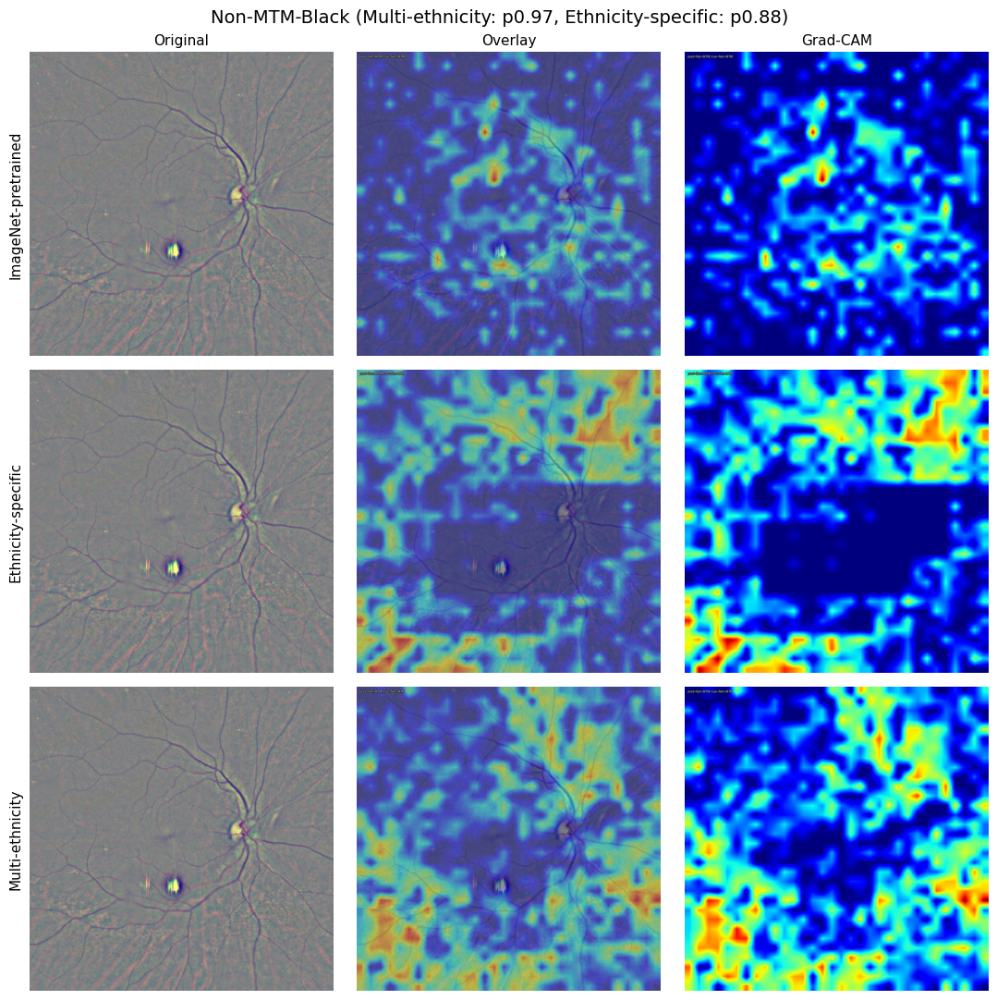

In [41]:
show_combo_grid(
    "Non-MTM-Black", 
    figsize=(11, 11),
    save=True,
    save_root=FIGURES_ROOT,      # defaults to figures/ already
    save_subdir="exported_panels",
    save_format="png",
)

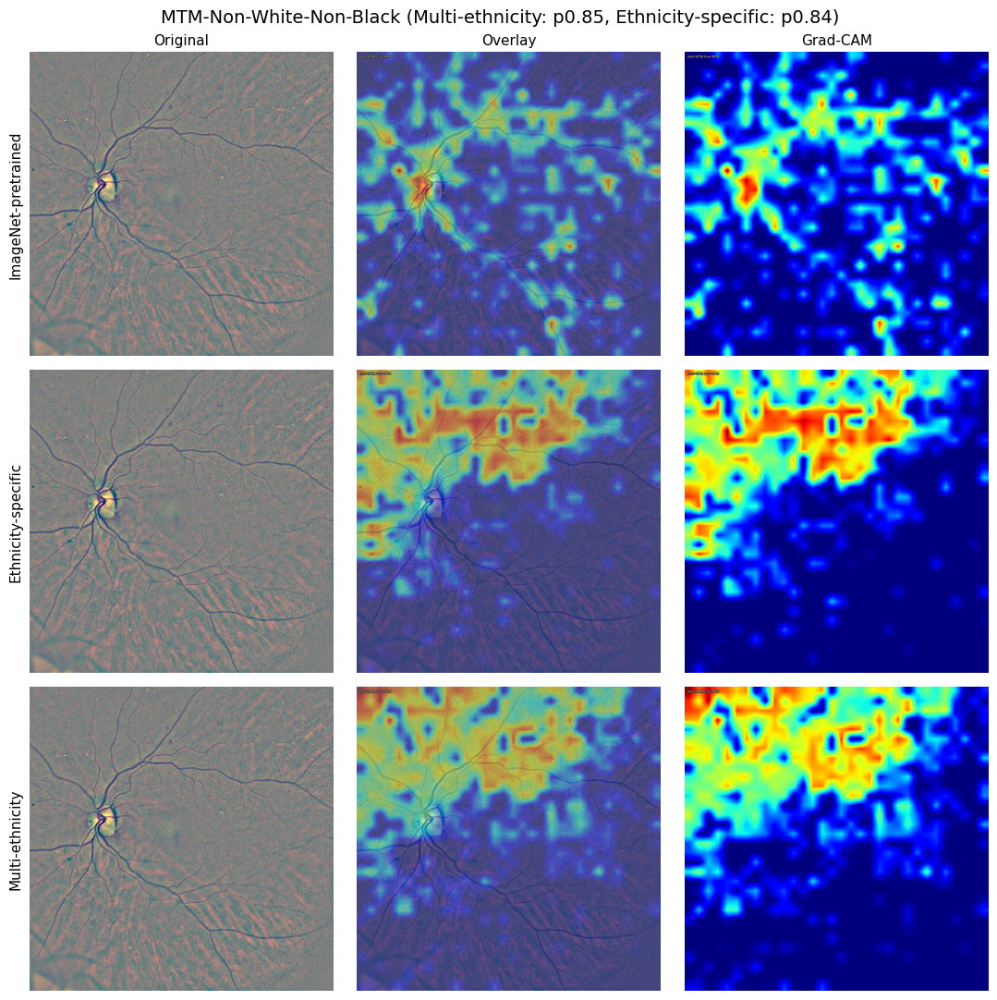

In [42]:
show_combo_grid(
    "MTM-Non-White-Non-Black", 
    figsize=(11, 11),
    save=True,
    save_root=FIGURES_ROOT,      # defaults to figures/ already
    save_subdir="exported_panels",
    save_format="png",
)

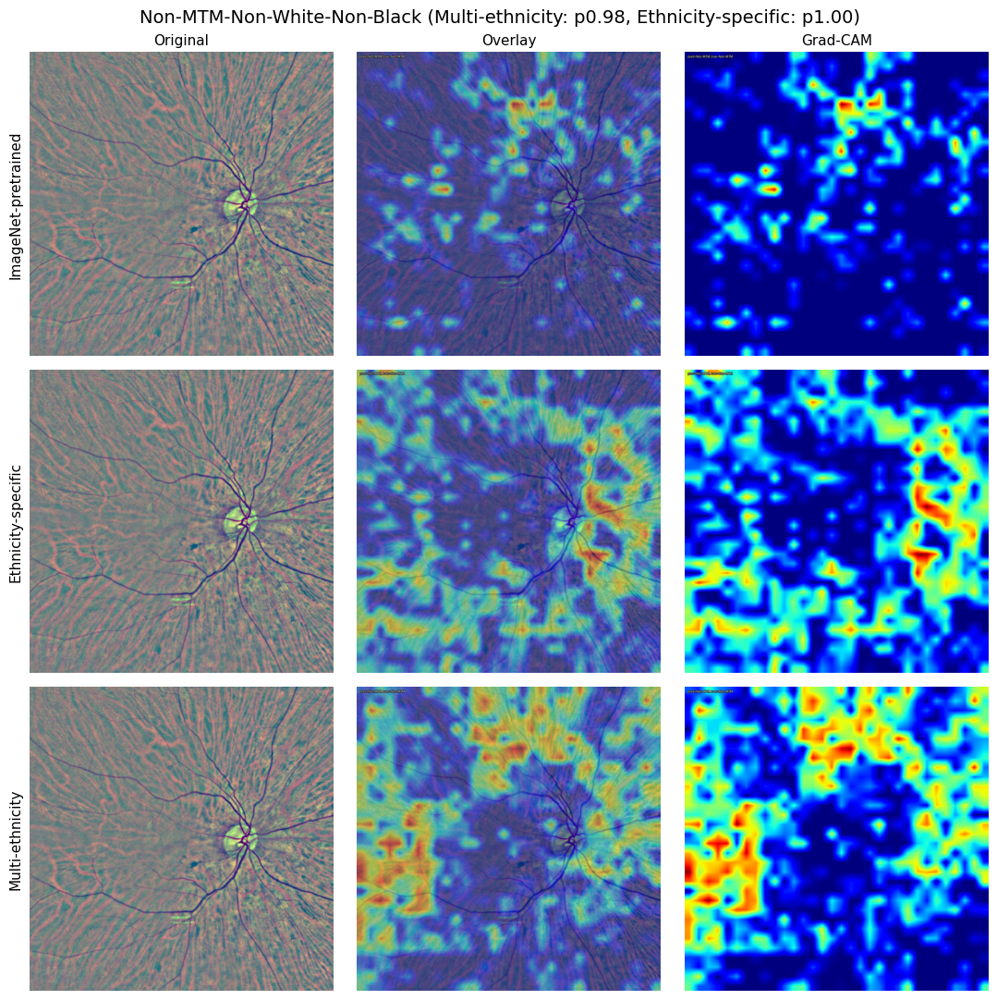

In [43]:
show_combo_grid(
    "Non-MTM-Non-White-Non-Black", 
    figsize=(11, 11),
    save=True,
    save_root=FIGURES_ROOT,      # defaults to figures/ already
    save_subdir="exported_panels",
    save_format="png",
)